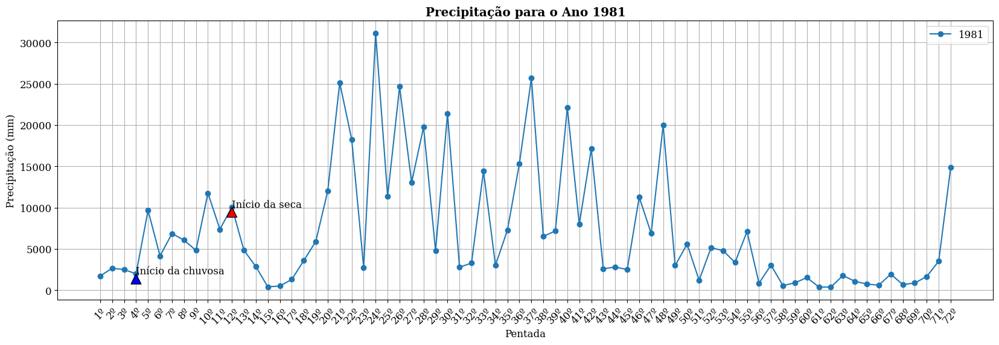

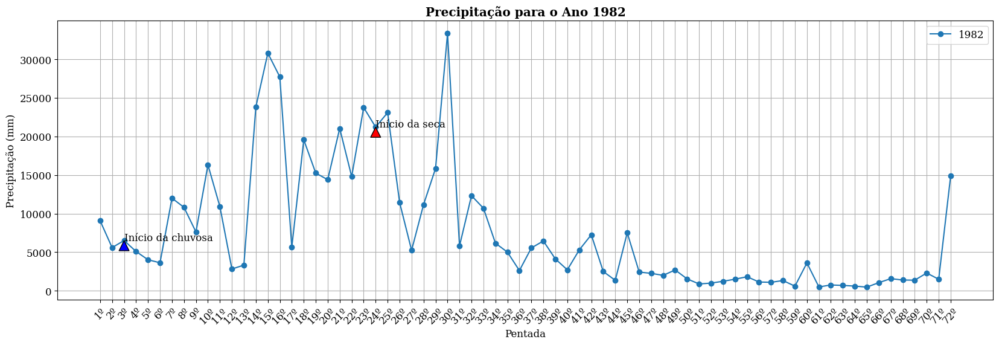

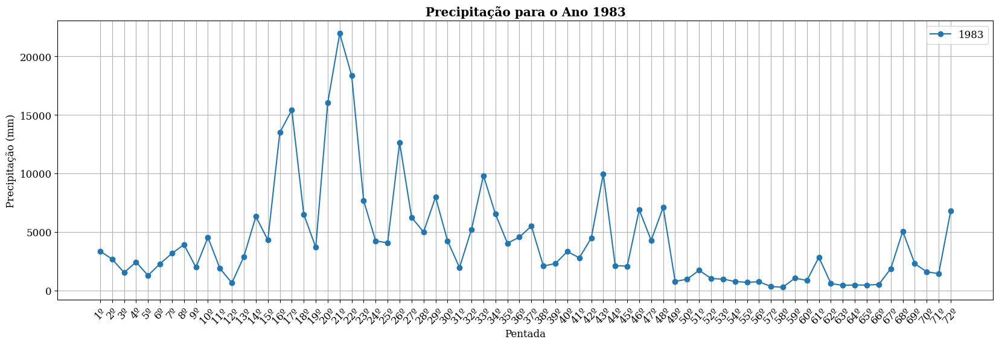

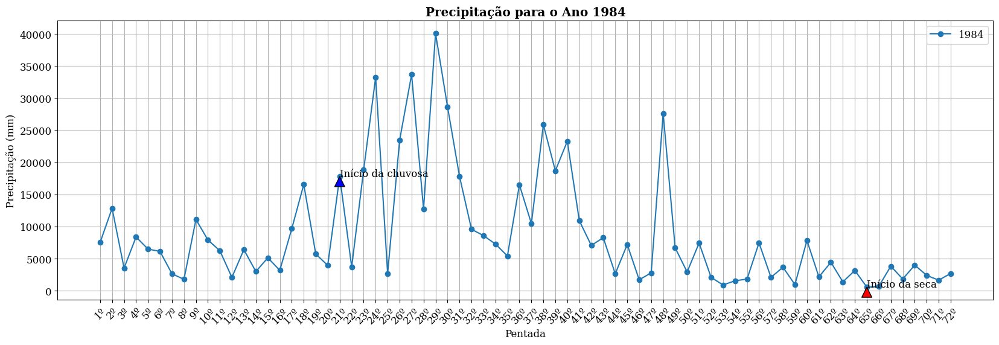

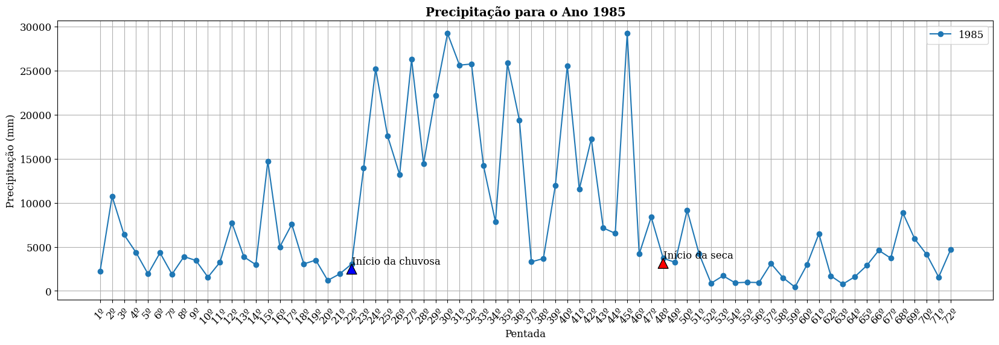

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Ler arquivo Excel
amazonia = '/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/AreaDesmatadaTeste.xlsx'
df = pd.read_excel(amazonia)

# Inicializar listas para armazenar resultados
inicio_seca = []
duracao_seca = []
inicio_chuvosa = []

# Pegar todas as colunas de anos, exceto 'Pentada' e 'Média'
anos = df.columns[:-2]  # Assume que as últimas colunas são 'Pentada' e 'Média'

def identificar_estacoes(ano):
    encontrou_inicio_chuvosa = False
    encontrou_inicio_seca = False
    pentada_chuvosa = None
    pentada_seca = None

    for i in range(len(df) - 7):
        abaixo_da_media_count = 0
        acima_da_media_count = 0
        
        # Verificar as 8 pentadas a partir da linha atual para a estação chuvosa
        for j in range(8):
            if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:  # Comparar com a média da pentada
                abaixo_da_media_count += 1
            if df.iloc[i + j][ano] > df.iloc[i + j]["Média"]:  # Comparar com a média da pentada
                acima_da_media_count += 1

        # Se 6 ou mais pentadas dentro das 8 estiverem acima da média da pentada e ainda não encontrou o início da estação chuvosa
        if acima_da_media_count >= 6 and not encontrou_inicio_chuvosa:
            pentada_chuvosa = df.iloc[i]["Pentada"]
            inicio_chuvosa.append((ano, pentada_chuvosa, df.iloc[i][ano]))  # Armazena o valor também
            encontrou_inicio_chuvosa = True

        # Se já encontrou o início da chuvosa e ainda não encontrou o início da estação seca
        if encontrou_inicio_chuvosa and not encontrou_inicio_seca:
            abaixo_da_media_count = 0  # Resetando o contador para a estação seca
            
            # Verificar as 8 pentadas a partir da linha atual para a estação seca
            for j in range(8):
                if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:  # Comparar com a média da pentada
                    abaixo_da_media_count += 1
            
            # Se 6 ou mais pentadas dentro das 8 estiverem abaixo da média da pentada
            if abaixo_da_media_count >= 6:
                pentada_seca = df.iloc[i]["Pentada"]
                inicio_seca.append((ano, pentada_seca, df.iloc[i][ano]))  # Armazena o valor também
                encontrou_inicio_seca = True
                
                # Calcular a duração da estação seca
                duracao = 0
                for k in range(i, len(df)):
                    if df.iloc[k][ano] < df.iloc[k]["Média"]:  # Comparar com a média da pentada
                        duracao += 1
                    else:
                        break
                
                duracao_seca.append(f'Ano: {ano}, Duração da estação seca: {duracao} pentadas')

    return pentada_chuvosa, pentada_seca

# Loop pelos anos e verificar o que acontece primeiro
for ano in anos:
    pentada_chuvosa, pentada_seca = identificar_estacoes(ano)
    
# Configurar a fonte serif
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 12

# Plotar gráfico de linha para cada ano
for ano in anos:
    plt.figure(figsize=(20, 6))
    plt.plot(df["Pentada"], df[ano], marker='o', label=ano)

    # Adicionar setas para o início da estação chuvosa
    for (ano_chuv, pentada_chuv, valor_chuv) in inicio_chuvosa:
        if ano_chuv == ano:
            plt.annotate('Início da chuvosa', 
                         xy=(pentada_chuv, valor_chuv), 
                         xytext=(pentada_chuv, valor_chuv + 0.5),
                         arrowprops=dict(facecolor='blue', shrink=0.05))

    # Adicionar setas para o início da estação seca
    for (ano_sec, pentada_sec, valor_sec) in inicio_seca:
        if ano_sec == ano:
            plt.annotate('Início da seca', 
                         xy=(pentada_sec, valor_sec), 
                         xytext=(pentada_sec, valor_sec + 0.5),
                         arrowprops=dict(facecolor='red', shrink=0.05))

    plt.title(f'Precipitação para o Ano {ano}', fontweight='bold')  # Título em negrito
    plt.xlabel('Pentada')
    plt.xticks(rotation=45)  # Rotacionar as etiquetas do eixo x
    plt.ylabel('Precipitação (mm)')
    plt.legend()
    plt.grid()
    plt.show()


In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Ler arquivo Excel
amazonia = '/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/AreaDesmatadaTeste.xlsx'
df = pd.read_excel(amazonia)

# Inicializar listas para armazenar resultados
inicio_seca = []
duracao_seca = []
inicio_chuvosa = []

# Pegar todas as colunas de anos, exceto 'Pentada' e 'Média'
anos = df.columns[:-2]  # Assume que as últimas colunas são 'Pentada' e 'Média'

def identificar_estacoes(ano):
    encontrou_inicio_chuvosa = False
    encontrou_inicio_seca = False
    pentada_chuvosa = None
    pentada_seca = None

    for i in range(len(df) - 7):
        abaixo_da_media_count = 0
        acima_da_media_count = 0
        
        # Verificar as 8 pentadas a partir da linha atual para a estação chuvosa
        for j in range(8):
            if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:  # Comparar com a média da pentada
                abaixo_da_media_count += 1
            if df.iloc[i + j][ano] > df.iloc[i + j]["Média"]:  # Comparar com a média da pentada
                acima_da_media_count += 1

        # Se 6 ou mais pentadas dentro das 8 estiverem acima da média da pentada e ainda não encontrou o início da estação chuvosa
        if acima_da_media_count >= 6 and not encontrou_inicio_chuvosa:
            pentada_chuvosa = df.iloc[i]["Pentada"]
            inicio_chuvosa.append((ano, pentada_chuvosa, df.iloc[i][ano]))  # Armazena o valor também
            encontrou_inicio_chuvosa = True

        # Se já encontrou o início da chuvosa e ainda não encontrou o início da estação seca
        if encontrou_inicio_chuvosa and not encontrou_inicio_seca:
            abaixo_da_media_count = 0  # Resetando o contador para a estação seca
            
            # Verificar as 8 pentadas a partir da linha atual para a estação seca
            for j in range(8):
                if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:  # Comparar com a média da pentada
                    abaixo_da_media_count += 1
            
            # Se 6 ou mais pentadas dentro das 8 estiverem abaixo da média da pentada
            if abaixo_da_media_count >= 6:
                pentada_seca = df.iloc[i]["Pentada"]
                inicio_seca.append((ano, pentada_seca, df.iloc[i][ano]))  # Armazena o valor também
                encontrou_inicio_seca = True
                
                # Calcular a duração da estação seca
                duracao = 0
                for k in range(i, len(df)):
                    if df.iloc[k][ano] < df.iloc[k]["Média"]:  # Comparar com a média da pentada
                        duracao += 1
                    else:
                        break
                
                duracao_seca.append(f'Ano: {ano}, Duração da estação seca: {duracao} pentadas')

    return pentada_chuvosa, pentada_seca

# Loop pelos anos e verificar o que acontece primeiro
for ano in anos:
    pentada_chuvosa, pentada_seca = identificar_estacoes(ano)
    
    if pentada_chuvosa is not None and pentada_seca is not None:
        if pentada_chuvosa < pentada_seca:
            print(f'Ano: {ano} - Início da estação chuvosa ocorre antes (Pentada: {pentada_chuvosa}), seguida pelo início da seca (Pentada: {pentada_seca})')
        else:
            print(f'Ano: {ano} - Início da estação seca ocorre antes (Pentada: {pentada_seca}), seguida pelo início da chuvosa (Pentada: {pentada_chuvosa})')
    elif pentada_chuvosa is not None:
        print(f'Ano: {ano} - Apenas início da estação chuvosa ocorre (Pentada: {pentada_chuvosa})')
    elif pentada_seca is not None:
        print(f'Ano: {ano} - Apenas início da estação seca ocorre (Pentada: {pentada_seca})')

# Imprime os resultados da estação chuvosa
if inicio_chuvosa:
    for ano, pentada, valor in inicio_chuvosa:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação chuvosa (Valor: {valor})')

# Imprime os resultados da estação seca
if inicio_seca:
    for ano, pentada, valor in inicio_seca:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação seca (Valor: {valor})')


Ano: 1981 - Início da estação seca ocorre antes (Pentada: 12º), seguida pelo início da chuvosa (Pentada: 4º)
Ano: 1982 - Início da estação seca ocorre antes (Pentada: 24º), seguida pelo início da chuvosa (Pentada: 3º)
Ano: 1984 - Início da estação chuvosa ocorre antes (Pentada: 21º), seguida pelo início da seca (Pentada: 65º)
Ano: 1985 - Início da estação chuvosa ocorre antes (Pentada: 22º), seguida pelo início da seca (Pentada: 48º)
Ano: 1981, Pentada: 4º - Início da estação chuvosa (Valor: 1973.20062220517)
Ano: 1982, Pentada: 3º - Início da estação chuvosa (Valor: 6511.94383394765)
Ano: 1984, Pentada: 21º - Início da estação chuvosa (Valor: 17805.0504888871)
Ano: 1985, Pentada: 22º - Início da estação chuvosa (Valor: 3051.68532079388)
Ano: 1981, Pentada: 12º - Início da estação seca (Valor: 10065.2837558821)
Ano: 1982, Pentada: 24º - Início da estação seca (Valor: 21211.565974703)
Ano: 1984, Pentada: 65º - Início da estação seca (Valor: 567.415354377382)
Ano: 1985, Pentada: 48º - In

Ano: 1981, Pentada: 4º - Início da estação chuvosa (Valor: 1973.20062220517)
Ano: 1981, Pentada: 46º - Início da estação chuvosa (Valor: 11271.9673033097)
Ano: 1982, Pentada: 3º - Início da estação chuvosa (Valor: 6511.94383394765)
Ano: 1984, Pentada: 21º - Início da estação chuvosa (Valor: 17805.0504888871)
Ano: 1985, Pentada: 22º - Início da estação chuvosa (Valor: 3051.68532079388)
Ano: 1985, Pentada: 60º - Início da estação chuvosa (Valor: 2947.92113074508)
Ano: 1981, Pentada: 12º - Início da estação seca (Valor: 10065.2837558821)
Ano: 1981, Pentada: 58º - Início da estação seca (Valor: 543.400246790344)
Ano: 1982, Pentada: 24º - Início da estação seca (Valor: 21211.565974703)
Ano: 1984, Pentada: 65º - Início da estação seca (Valor: 567.415354377382)
Ano: 1985, Pentada: 48º - Início da estação seca (Valor: 3707.43783900691)


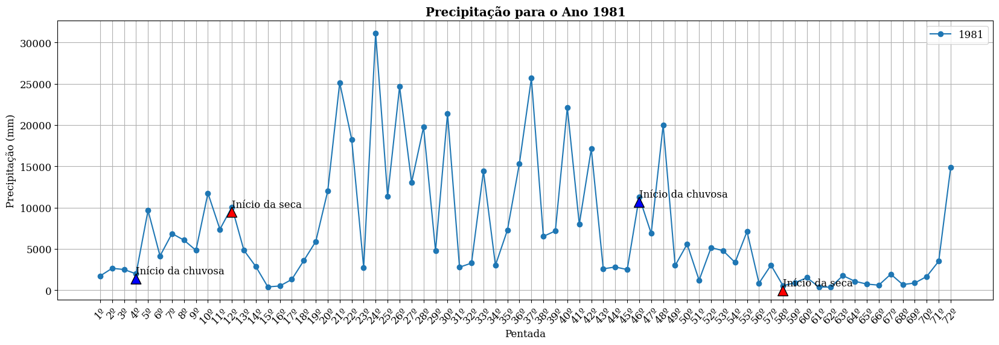

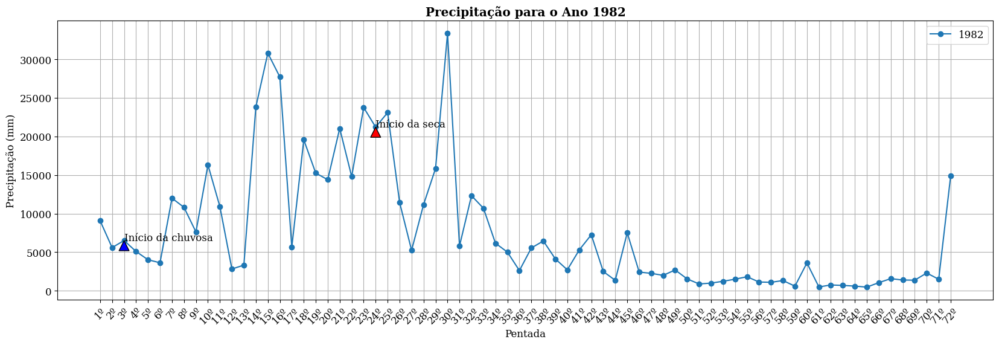

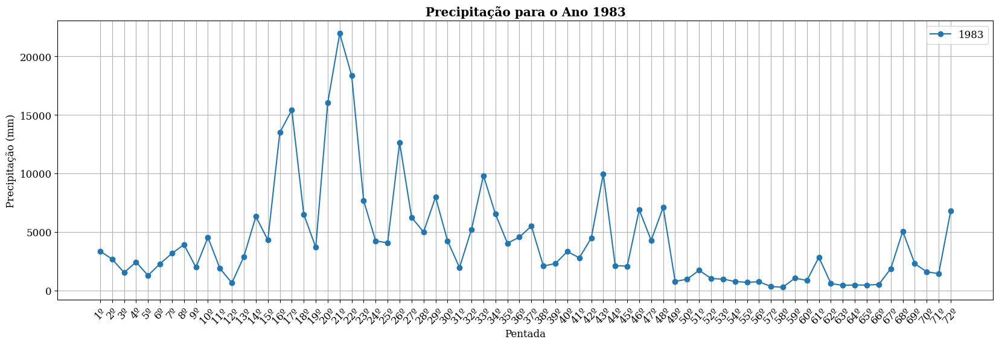

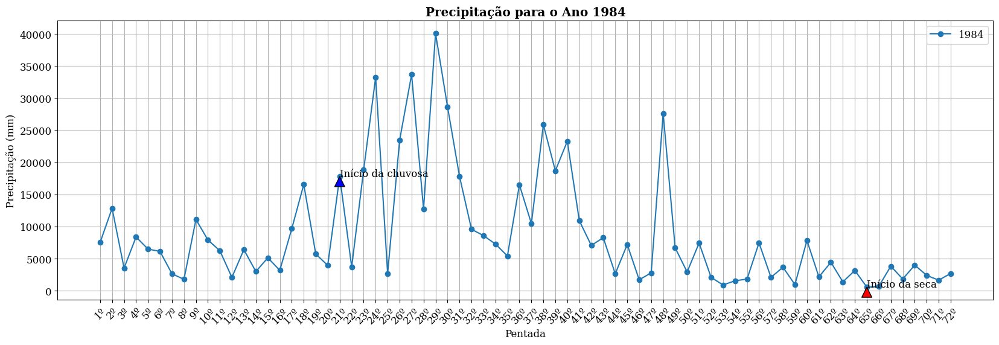

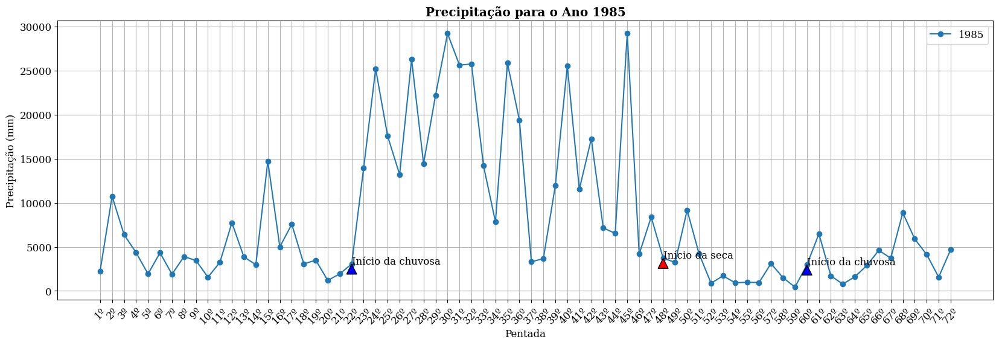

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Ler arquivo Excel
amazonia = '/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/AreaDesmatadaTeste.xlsx'
df = pd.read_excel(amazonia)

# Inicializar listas para armazenar resultados
inicio_seca = []
inicio_chuvosa = []

# Pegar todas as colunas de anos, exceto 'Pentada'
anos = df.columns[:-2]  # Assume que as últimas colunas são 'Pentada' e 'Média'

def identificar_estacoes(ano):
    i = 0
    chuvosa_ativa = False  # Flag para controlar se a estação chuvosa está ativa

    while i < len(df) - 7:
        abaixo_da_media_count = 0
        acima_da_media_count = 0
        
        # Verificar as 8 pentadas a partir da linha atual para a estação chuvosa
        for j in range(8):
            if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:
                abaixo_da_media_count += 1
            if df.iloc[i + j][ano] > df.iloc[i + j]["Média"]:
                acima_da_media_count += 1

        # Se 6 ou mais pentadas dentro das 8 estiverem acima da média e a chuvosa não está ativa
        if acima_da_media_count >= 6 and not chuvosa_ativa:
            pentada_chuvosa = df.iloc[i]["Pentada"]
            inicio_chuvosa.append((ano, pentada_chuvosa, df.iloc[i][ano]))  # Armazena o valor também
            chuvosa_ativa = True  # Ativa a estação chuvosa
            i += 8  # Avança o índice
            continue  # Volta para o início do loop

        # Se a estação chuvosa está ativa, verificar o início da estação seca
        if chuvosa_ativa:
            abaixo_da_media_count = 0
            for j in range(8):
                if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:
                    abaixo_da_media_count += 1
            
            # Se 6 ou mais pentadas dentro das 8 estiverem abaixo da média anual
            if abaixo_da_media_count >= 6:
                pentada_seca = df.iloc[i]["Pentada"]
                inicio_seca.append((ano, pentada_seca, df.iloc[i][ano]))  # Armazena o valor também
                chuvosa_ativa = False  # Desativa a estação chuvosa, pois agora é seca
                i += 8  # Avança o índice para evitar marcações repetidas
            else:
                i += 1  # Avança para a próxima linha
        else:
            i += 1  # Avança para a próxima linha

# Loop pelos anos e verificar o que acontece primeiro
for ano in anos:
    identificar_estacoes(ano)

# Imprime os resultados da estação chuvosa
if inicio_chuvosa:
    for ano, pentada, valor in inicio_chuvosa:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação chuvosa (Valor: {valor})')

# Imprime os resultados da estação seca
if inicio_seca:
    for ano, pentada, valor in inicio_seca:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação seca (Valor: {valor})')

# Configurar a fonte serif
plt.rcParams['font.family'] = 'serif'

# Plotar gráfico de linha
for ano in anos:
    plt.figure(figsize=(20, 6))
    plt.plot(df["Pentada"], df[ano], marker='o', label=ano)

    # Adicionar setas para o início da estação seca
    for (ano_sec, pentada_sec, valor_sec) in inicio_seca:
        if ano_sec == ano:
            plt.annotate('Início da seca', 
                         xy=(pentada_sec, valor_sec), 
                         xytext=(pentada_sec, valor_sec + 0.5),
                         arrowprops=dict(facecolor='red', shrink=0.05))

    # Adicionar setas para o início da estação chuvosa
    for (ano_chuv, pentada_chuv, valor_chuv) in inicio_chuvosa:
        if ano_chuv == ano:
            plt.annotate('Início da chuvosa', 
                         xy=(pentada_chuv, valor_chuv), 
                         xytext=(pentada_chuv, valor_chuv + 0.5),
                         arrowprops=dict(facecolor='blue', shrink=0.05))

    plt.title(f'Precipitação para o Ano {ano}', fontweight='bold')  # Título em negrito
    plt.xlabel('Pentada')
    plt.xticks(rotation=45)  # Rotacionar as etiquetas do eixo x
    plt.ylabel('Precipitação (mm)')
    plt.legend()
    plt.grid()
    plt.show()


Ano: 1981, Pentada: 45º - Início da estação chuvosa (Valor: 2493.83735448426)
Ano: 1982, Pentada: 7º - Início da estação chuvosa (Valor: 12000.9895013248)
Ano: 1984, Pentada: 23º - Início da estação chuvosa (Valor: 18863.9817506529)
Ano: 1985, Pentada: 26º - Início da estação chuvosa (Valor: 13208.3018001182)
Ano: 1985, Pentada: 63º - Início da estação chuvosa (Valor: 768.910952103839)
Ano: 1986, Pentada: 31º - Início da estação chuvosa (Valor: 25920.8252842024)
Ano: 1988, Pentada: 26º - Início da estação chuvosa (Valor: 31350.272032001)
Ano: 1988, Pentada: 64º - Início da estação chuvosa (Valor: 1143.3942692032)
Ano: 1989, Pentada: 11º - Início da estação chuvosa (Valor: 13390.1045455783)
Ano: 1990, Pentada: 1º - Início da estação chuvosa (Valor: 5756.42538068435)
Ano: 1991, Pentada: 25º - Início da estação chuvosa (Valor: 2466.78004332337)
Ano: 1993, Pentada: 60º - Início da estação chuvosa (Valor: 5040.25152989556)
Ano: 1994, Pentada: 3º - Início da estação chuvosa (Valor: 7336.3123

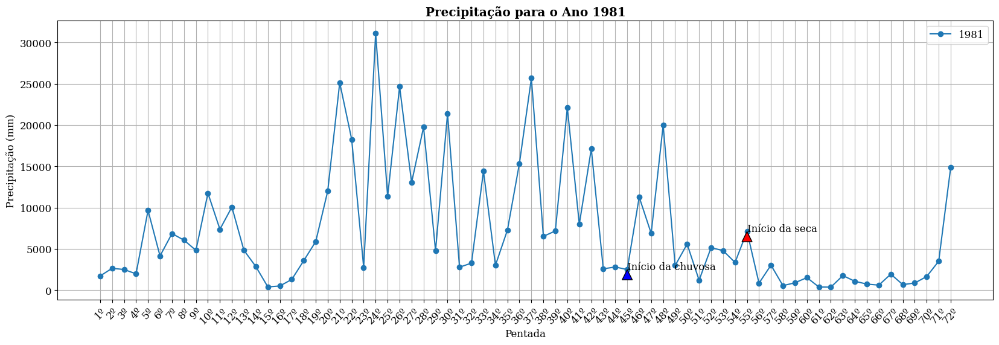

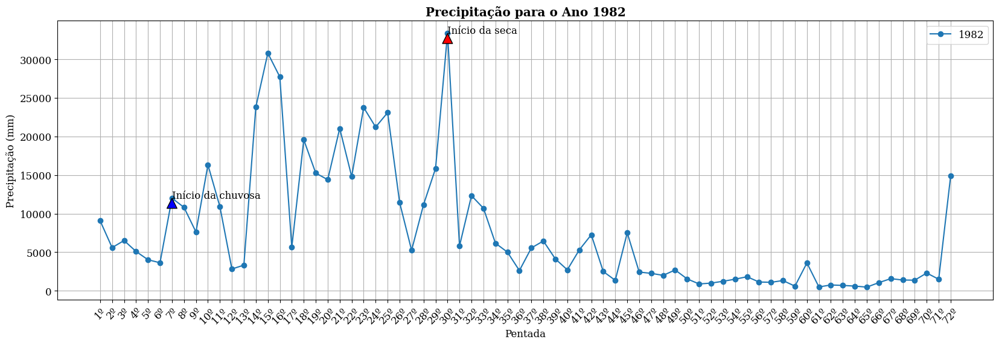

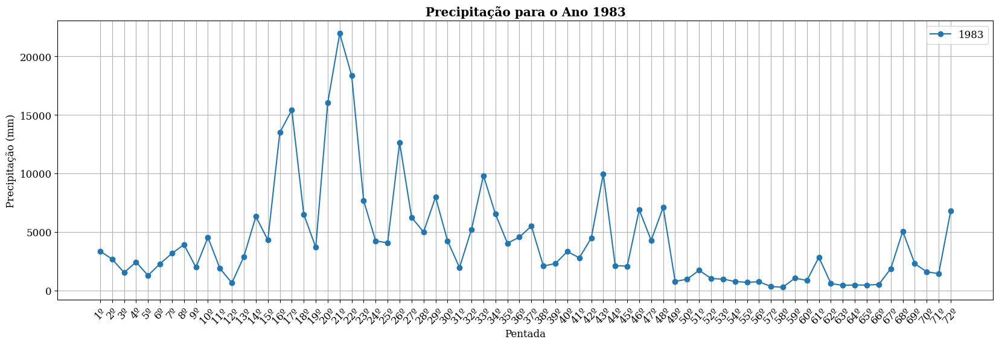

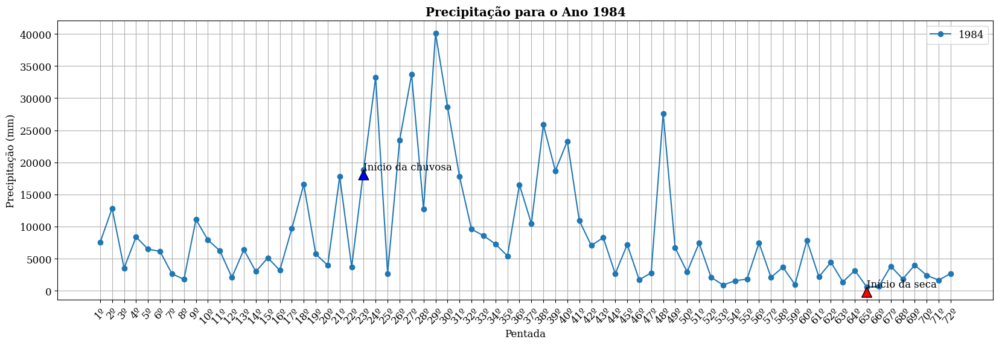

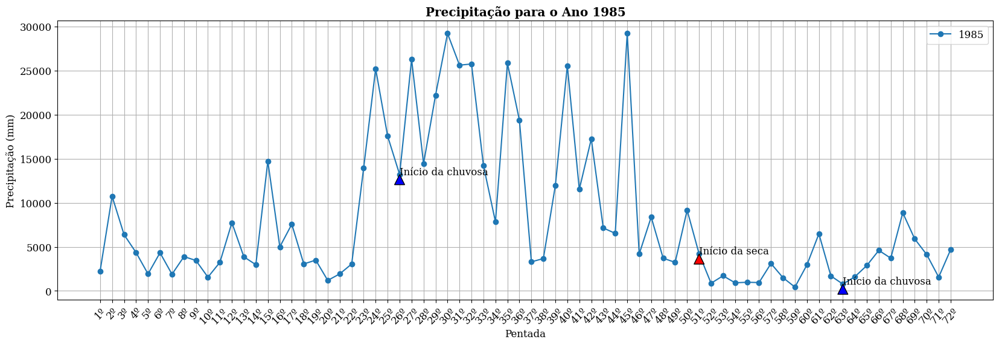

...

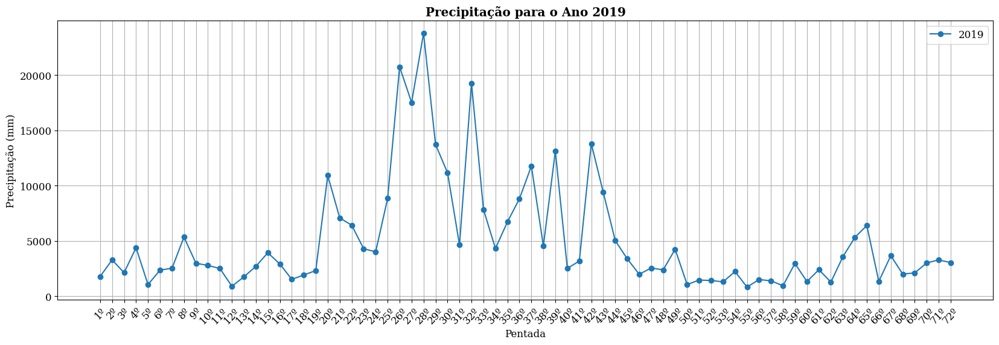

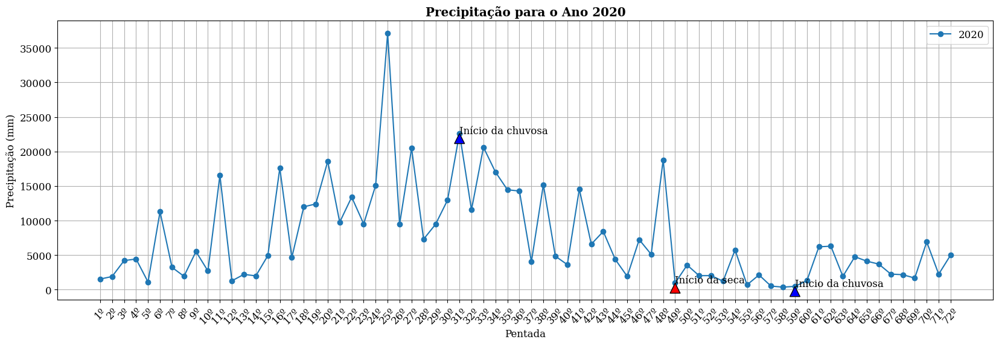

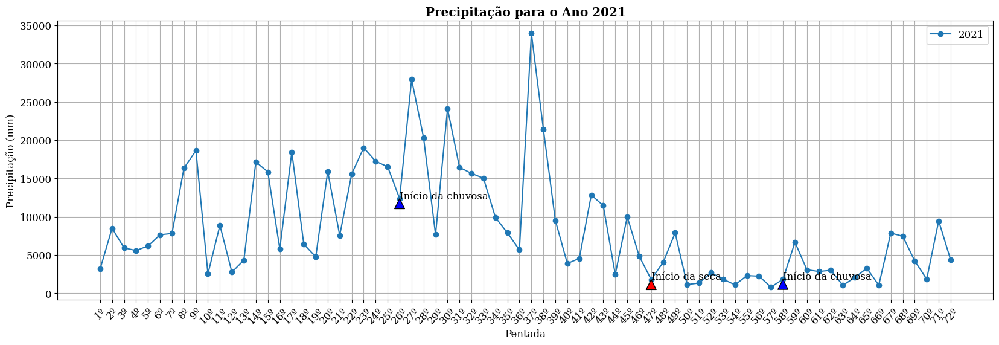

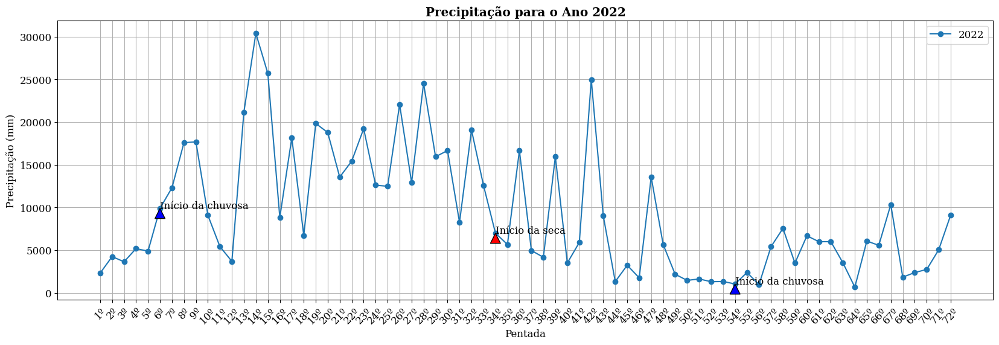

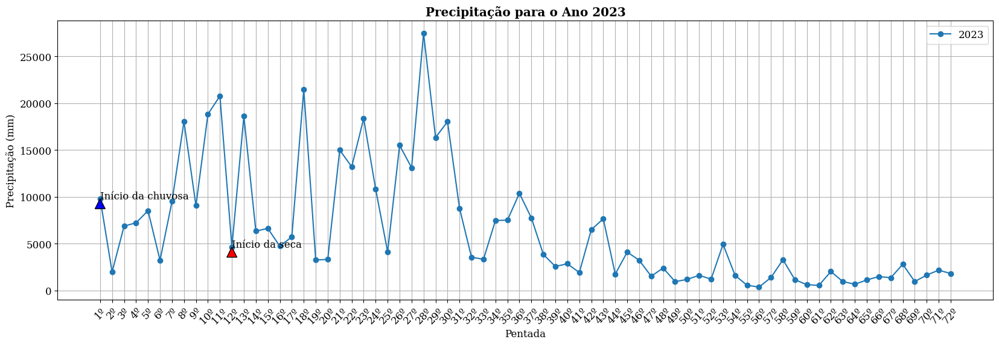

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Ler arquivo Excel
amazonia = '/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/Amazonia_pentada_areaDesmatada1.xlsx'
df = pd.read_excel(amazonia)

# Inicializar listas para armazenar resultados
inicio_seca = []
inicio_chuvosa = []

# Pegar todas as colunas de anos, exceto 'Pentada'
anos = df.columns[:-2]  # Assume que as últimas colunas são 'Pentada' e 'Média'

def identificar_estacoes(ano):
    i = 0
    chuvosa_ativa = False  # Flag para controlar se a estação chuvosa está ativa

    while i < len(df) - 7:
        abaixo_da_media_count = 0
        acima_da_media_count = 0
        
        # Verificar as 8 pentadas a partir da linha atual para a estação chuvosa
        for j in range(8):
            if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:
                abaixo_da_media_count += 1
            if df.iloc[i + j][ano] > df.iloc[i + j]["Média"]:
                acima_da_media_count += 1

        # Se 6 ou mais pentadas dentro das 8 estiverem acima da média e a chuvosa não está ativa
        if acima_da_media_count >= 6 and not chuvosa_ativa:
            pentada_chuvosa = df.iloc[i]["Pentada"]
            inicio_chuvosa.append((ano, pentada_chuvosa, df.iloc[i][ano]))  # Armazena o valor também
            chuvosa_ativa = True  # Ativa a estação chuvosa
            i += 8  # Avança o índice
            continue  # Volta para o início do loop

        # Se a estação chuvosa está ativa, verificar o início da estação seca
        if chuvosa_ativa:
            abaixo_da_media_count = 0
            for j in range(8):
                if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:
                    abaixo_da_media_count += 1
            
            # Se 6 ou mais pentadas dentro das 8 estiverem abaixo da média anual
            if abaixo_da_media_count >= 6:
                pentada_seca = df.iloc[i]["Pentada"]
                inicio_seca.append((ano, pentada_seca, df.iloc[i][ano]))  # Armazena o valor também
                chuvosa_ativa = False  # Desativa a estação chuvosa, pois agora é seca
                i += 8  # Avança o índice para evitar marcações repetidas
            else:
                i += 1  # Avança para a próxima linha
        else:
            i += 1  # Avança para a próxima linha

# Loop pelos anos e verificar o que acontece primeiro
for ano in anos:
    identificar_estacoes(ano)

# Imprime os resultados da estação chuvosa
if inicio_chuvosa:
    for ano, pentada, valor in inicio_chuvosa:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação chuvosa (Valor: {valor})')

# Imprime os resultados da estação seca
if inicio_seca:
    for ano, pentada, valor in inicio_seca:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação seca (Valor: {valor})')

# Configurar a fonte serif
plt.rcParams['font.family'] = 'serif'

# Plotar gráfico de linha
for ano in anos:
    plt.figure(figsize=(20, 6))
    plt.plot(df["Pentada"], df[ano], marker='o', label=ano)

    # Adicionar setas para o início da estação seca
    for (ano_sec, pentada_sec, valor_sec) in inicio_seca:
        if ano_sec == ano:
            plt.annotate('Início da seca', 
                         xy=(pentada_sec, valor_sec), 
                         xytext=(pentada_sec, valor_sec + 0.5),
                         arrowprops=dict(facecolor='red', shrink=0.05))

    # Adicionar setas para o início da estação chuvosa
    for (ano_chuv, pentada_chuv, valor_chuv) in inicio_chuvosa:
        if ano_chuv == ano:
            plt.annotate('Início da chuvosa', 
                         xy=(pentada_chuv, valor_chuv), 
                         xytext=(pentada_chuv, valor_chuv + 0.5),
                         arrowprops=dict(facecolor='blue', shrink=0.05))

    plt.title(f'Precipitação para o Ano {ano}', fontweight='bold')  # Título em negrito
    plt.xlabel('Pentada')
    plt.xticks(rotation=45)  # Rotacionar as etiquetas do eixo x
    plt.ylabel('Precipitação (mm)')
    plt.legend()
    plt.grid()
    plt.show()

In [15]:


import pandas as pd

# Carregar o arquivo Excel
arquivo = '/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/2014teste.xlsx'  # Substitua pelo caminho correto do seu arquivo
df = pd.read_excel(arquivo)

# Verificar se as colunas '1981' e 'Média' existem
if '2014' in df.columns and 'Média' in df.columns:
    # Criar uma lista para armazenar os resultados
    resultados = []

    # Loop para comparar cada pentada
    for i in range(len(df)):
        pentada = df.iloc[i]['Pentada'] if 'Pentada' in df.columns else i + 1  # Número da pentada
        valor_1981 = df.iloc[i]['2014']
        media = df.iloc[i]['Média']
        
        # Comparação entre o valor de 1981 e a média
        if valor_1981 > media:
            resultado = f'ACIMA da média ({media})'
        elif valor_1981 < media:
            resultado = f'ABAIXO da média ({media})'
        else:
            resultado = f'IGUAL à média ({media})'
        
        # Adicionar o resultado à lista
        resultados.append({'Pentada': pentada, 'Resultado': resultado})

    # Criar um DataFrame com os resultados
    df_resultados = pd.DataFrame(resultados)

    # Salvar os resultados em um novo arquivo Excel
    df_resultados.to_excel('/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/2014testeComparacao.xlsx', index=False)

    print("Resultados salvos em 'resultados_comparacao.xlsx'")
else:
    print("As colunas '2014' ou 'Média' não foram encontradas.")


Resultados salvos em 'resultados_comparacao.xlsx'


Ano: 1981, Pentada: 6º - Início da estação chuvosa (Valor: 56344.778116493)
Ano: 1982, Pentada: 9º - Início da estação chuvosa (Valor: 26034.1326456451)
Ano: 1983, Pentada: 17º - Início da estação chuvosa (Valor: 65041.4429220092)
Ano: 1984, Pentada: 25º - Início da estação chuvosa (Valor: 64449.2524172816)
Ano: 1985, Pentada: 43º - Início da estação chuvosa (Valor: 124224.580758473)
Ano: 1986, Pentada: 29º - Início da estação chuvosa (Valor: 100606.71635798)
Ano: 1987, Pentada: 53º - Início da estação chuvosa (Valor: 117417.598810969)
Ano: 1988, Pentada: 30º - Início da estação chuvosa (Valor: 202926.85173814)
Ano: 1990, Pentada: 18º - Início da estação chuvosa (Valor: 54958.2133961397)
Ano: 1993, Pentada: 57º - Início da estação chuvosa (Valor: 81739.3748754997)
Ano: 1994, Pentada: 43º - Início da estação chuvosa (Valor: 208371.178761099)
Ano: 1995, Pentada: 28º - Início da estação chuvosa (Valor: 174484.508422674)
Ano: 1995, Pentada: 56º - Início da estação chuvosa (Valor: 69224.768

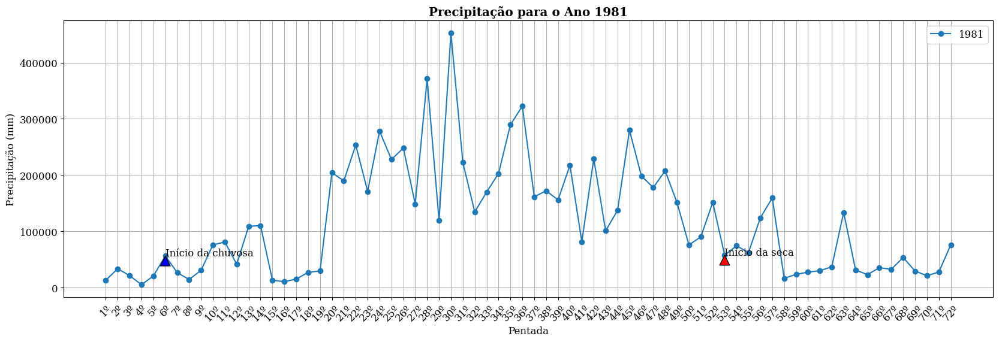

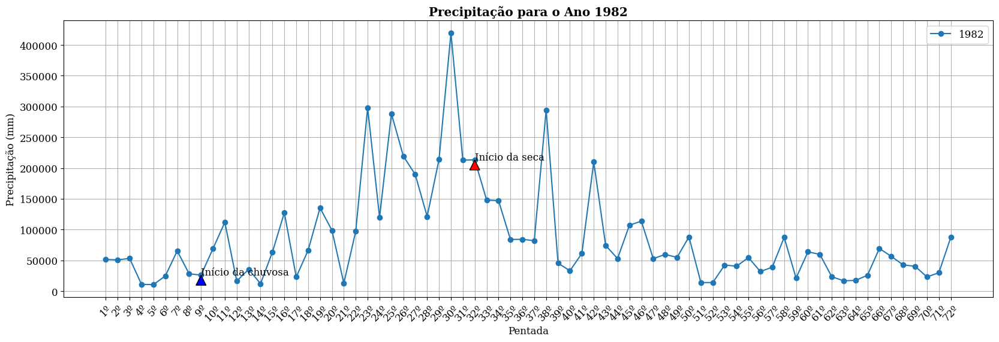

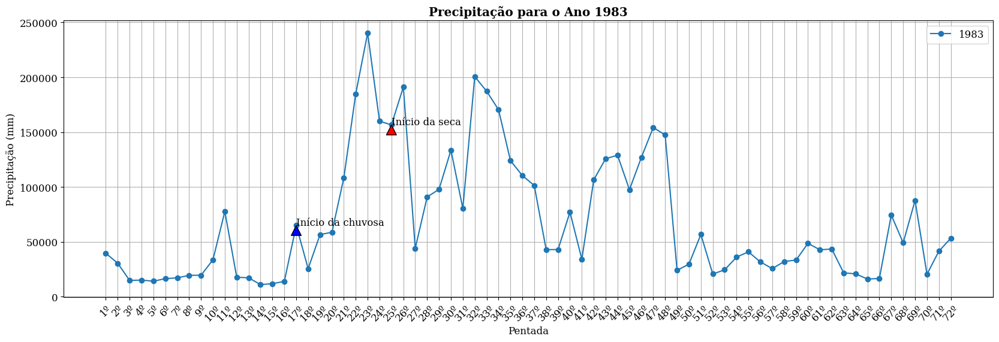

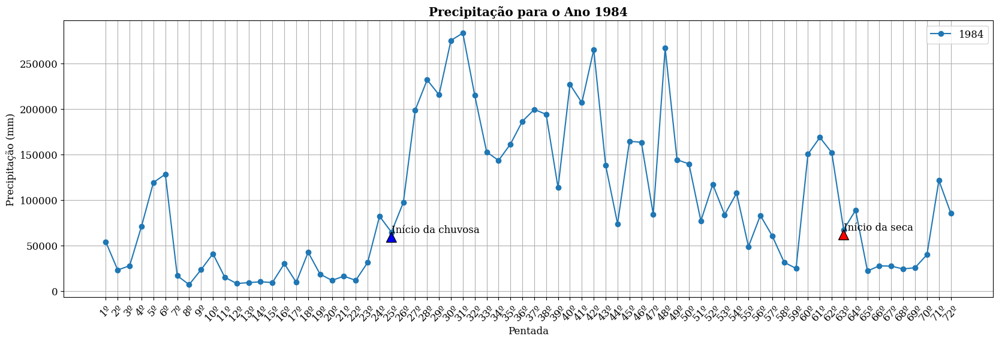

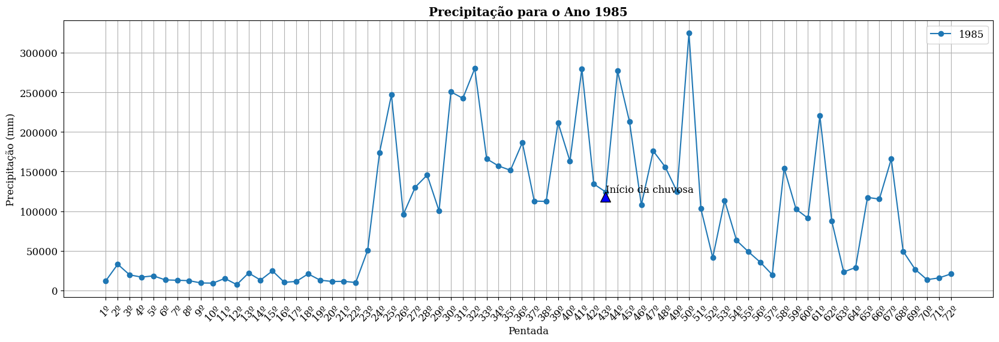

...

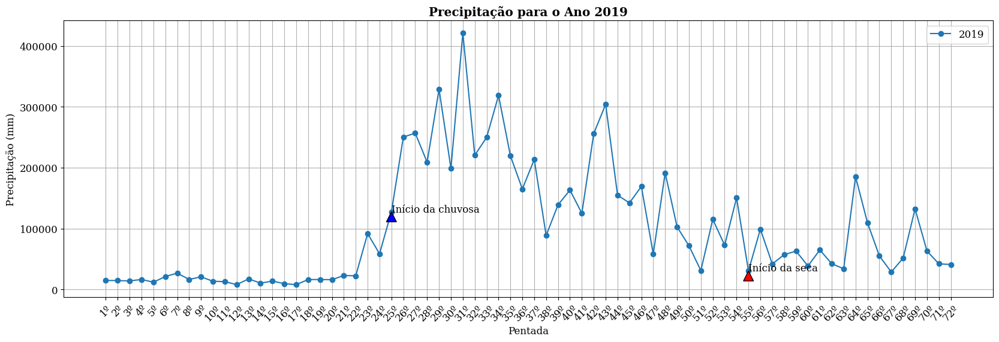

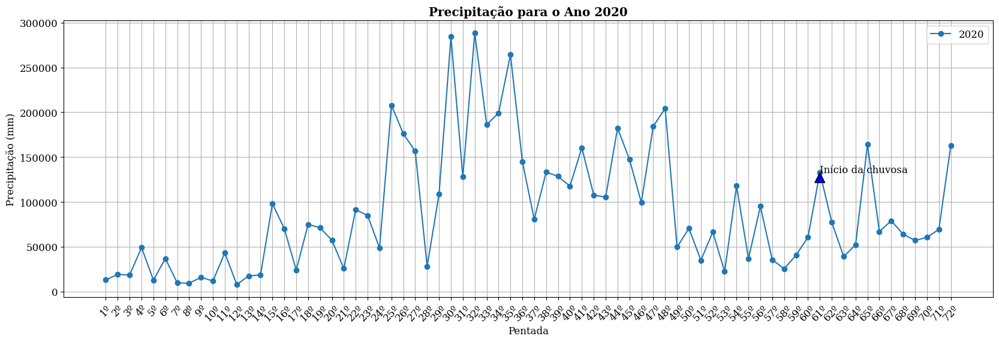

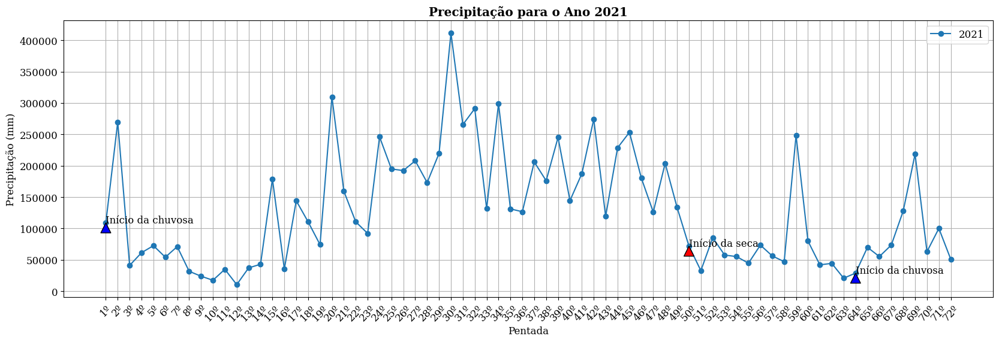

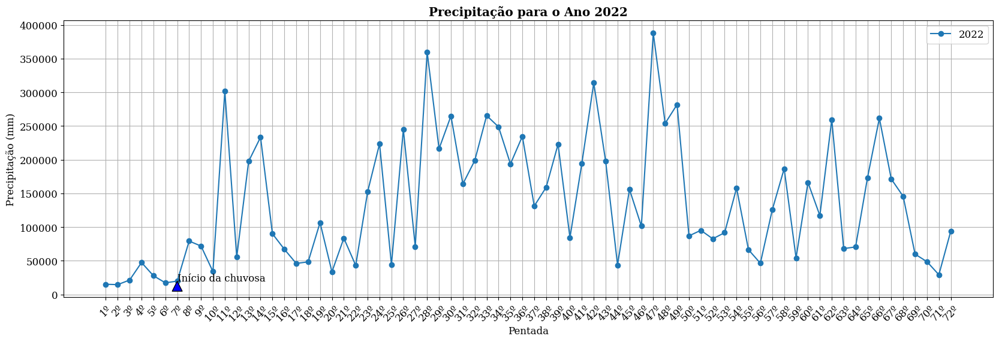

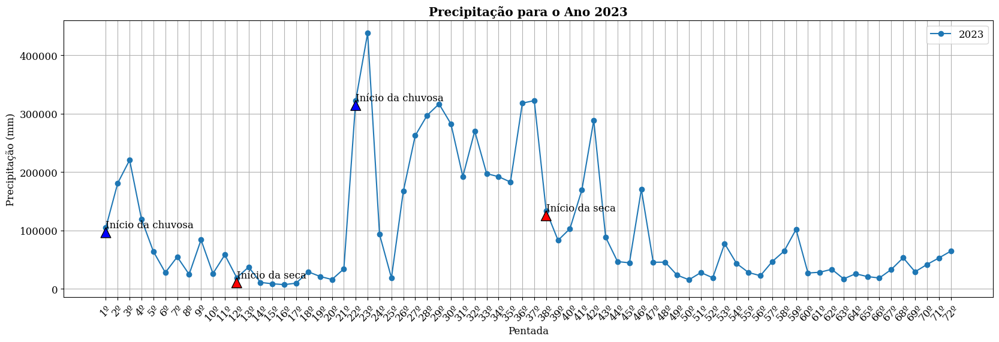

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Ler arquivo Excel
amazonia = '/home/talita/Documentos/calculo_climatologia/estudoEstacaoSeca/AreasEstudo/Amazonia_pentada_areaDesmatada2.xlsx'
df = pd.read_excel(amazonia)

# Inicializar listas para armazenar resultados
inicio_seca = []
inicio_chuvosa = []

# Pegar todas as colunas de anos, exceto 'Pentada'
anos = df.columns[:-2]  # Assume que as últimas colunas são 'Pentada' e 'Média'

def identificar_estacoes(ano):
    i = 0
    chuvosa_ativa = False  # Flag para controlar se a estação chuvosa está ativa

    while i < len(df) - 7:
        abaixo_da_media_count = 0
        acima_da_media_count = 0
        
        # Verificar as 8 pentadas a partir da linha atual para a estação chuvosa
        for j in range(8):
            if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:
                abaixo_da_media_count += 1
            if df.iloc[i + j][ano] > df.iloc[i + j]["Média"]:
                acima_da_media_count += 1

        # Se 6 ou mais pentadas dentro das 8 estiverem acima da média e a chuvosa não está ativa
        if acima_da_media_count >= 6 and not chuvosa_ativa:
            pentada_chuvosa = df.iloc[i]["Pentada"]
            inicio_chuvosa.append((ano, pentada_chuvosa, df.iloc[i][ano]))  # Armazena o valor também
            chuvosa_ativa = True  # Ativa a estação chuvosa
            i += 8  # Avança o índice
            continue  # Volta para o início do loop

        # Se a estação chuvosa está ativa, verificar o início da estação seca
        if chuvosa_ativa:
            abaixo_da_media_count = 0
            for j in range(8):
                if df.iloc[i + j][ano] < df.iloc[i + j]["Média"]:
                    abaixo_da_media_count += 1
            
            # Se 6 ou mais pentadas dentro das 8 estiverem abaixo da média anual
            if abaixo_da_media_count >= 6:
                pentada_seca = df.iloc[i]["Pentada"]
                inicio_seca.append((ano, pentada_seca, df.iloc[i][ano]))  # Armazena o valor também
                chuvosa_ativa = False  # Desativa a estação chuvosa, pois agora é seca
                i += 8  # Avança o índice para evitar marcações repetidas
            else:
                i += 1  # Avança para a próxima linha
        else:
            i += 1  # Avança para a próxima linha

# Loop pelos anos e verificar o que acontece primeiro
for ano in anos:
    identificar_estacoes(ano)

# Imprime os resultados da estação chuvosa
if inicio_chuvosa:
    for ano, pentada, valor in inicio_chuvosa:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação chuvosa (Valor: {valor})')

# Imprime os resultados da estação seca
if inicio_seca:
    for ano, pentada, valor in inicio_seca:
        print(f'Ano: {ano}, Pentada: {pentada} - Início da estação seca (Valor: {valor})')

# Configurar a fonte serif
plt.rcParams['font.family'] = 'serif'

# Plotar gráfico de linha
for ano in anos:
    plt.figure(figsize=(20, 6))
    plt.plot(df["Pentada"], df[ano], marker='o', label=ano)

    # Adicionar setas para o início da estação seca
    for (ano_sec, pentada_sec, valor_sec) in inicio_seca:
        if ano_sec == ano:
            plt.annotate('Início da seca', 
                         xy=(pentada_sec, valor_sec), 
                         xytext=(pentada_sec, valor_sec + 0.5),
                         arrowprops=dict(facecolor='red', shrink=0.05))

    # Adicionar setas para o início da estação chuvosa
    for (ano_chuv, pentada_chuv, valor_chuv) in inicio_chuvosa:
        if ano_chuv == ano:
            plt.annotate('Início da chuvosa', 
                         xy=(pentada_chuv, valor_chuv), 
                         xytext=(pentada_chuv, valor_chuv + 0.5),
                         arrowprops=dict(facecolor='blue', shrink=0.05))

    plt.title(f'Precipitação para o Ano {ano}', fontweight='bold')  # Título em negrito
    plt.xlabel('Pentada')
    plt.xticks(rotation=45)  # Rotacionar as etiquetas do eixo x
    plt.ylabel('Precipitação (mm)')
    plt.legend()
    plt.grid()
    plt.show()